# Brain MRI


## Logs

**20211017-232204** 15 epochs MobileNetV2  
Akurasi dengan data latih : 0.9831 | Loss : 0.0812   
Akurasi dengan data validasi : 1.0000 | Loss : 0.0748   
Akurasi dengan data tes: 0.9251 | Loss : 0.2083   

**20211017-233437** Xception 14 epochs  
Akurasi dengan data latih : 0.9435 | Loss : 0.1535   
Akurasi dengan data validasi : 0.9231 | Loss : 0.2990   
Akurasi dengan data tes: 0.9119 | Loss : 0.2207  

**20211018-064500** ResNet50V2  
Akurasi dengan data latih : 0.9831 | Loss : 0.0828   
Akurasi dengan data validasi : 0.9615 | Loss : 0.1330   
Akurasi dengan data tes: 0.9339 | Loss : 0.2142   

**20211018-065320** ResNet152V2  
Akurasi dengan data latih : 0.9944 | Loss : 0.0461   
Akurasi dengan data validasi : 0.9615 | Loss : 0.1489   
Akurasi dengan data tes: 0.9383 | Loss : 0.2214   

**20211018-070623** MobileNetV3  
Akurasi dengan data latih : 0.7966 | Loss : 0.5070   
Akurasi dengan data validasi : 0.7692 | Loss : 0.6086   
Akurasi dengan data tes: 0.8062 | Loss : 0.5226   

## Menghubungkan dengan Google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Masuk ke direktori kerja
%cd '/content/drive/MyDrive/Python Data/UTS'

/content/drive/MyDrive/Python Data/UTS


In [ ]:
pwd

'/content/drive/MyDrive/Python Data/UTS'

## Inisiasi library

In [ ]:
import tensorflow as tf
import keras
from keras.models import Sequential, Model
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import datetime, os
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications import ResNet50, ResNet152, ResNet50V2, ResNet152V2
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.mobilenet import preprocess_input
from keras.models import load_model
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

## Prepare dan Augmentasi Dataset

In [ ]:
# direktori dataset
dataset_path = "dataset/"

In [ ]:
train_datagen = ImageDataGenerator(
                rescale=1./255,
                rotation_range=20,
                horizontal_flip=True,
                shear_range=0.2,
                fill_mode='nearest'
)

validation_datagen = ImageDataGenerator(
                rescale=1./255,
                rotation_range=20,
                horizontal_flip=True,
                shear_range=0.2,
                fill_mode='nearest'
)

test_datagen = ImageDataGenerator(
                rescale=1./255,
                rotation_range=20,
                horizontal_flip=True,
                shear_range=0.2,
                fill_mode='nearest'
)

In [ ]:
train_gen = train_datagen.flow_from_directory(dataset_path+'train',
                                              target_size = (224,224),
                                              batch_size=2,
                                              class_mode="categorical",
                                              shuffle=True,
                                              seed=4,
                                              interpolation='bilinear'
                                              )

valid_gen = validation_datagen.flow_from_directory(dataset_path+'validation',
                                                   target_size=(224,224),
                                                   batch_size=1,
                                                   class_mode='categorical',
                                                   shuffle=True,
                                                   seed=5,
                                                   interpolation='bilinear'
                                                   )

test_gen = test_datagen.flow_from_directory(dataset_path+'test',
                                            target_size=(224,224),
                                            batch_size=1,
                                            class_mode='categorical',
                                            shuffle=False,
                                            )

Found 177 images belonging to 2 classes.
Found 26 images belonging to 2 classes.
Found 227 images belonging to 2 classes.


In [ ]:
print(test_gen.class_indices)

{'no': 0, 'yes': 1}


In [ ]:
train_data = tf.data.Dataset.from_generator(lambda: train_gen,
                                            output_types=(tf.float32, tf.float32),
                                            output_shapes=([None
                                                            , 224, 224, 3]
                                                            , [None, train_gen.num_classes])
                                            )
val_data = tf.data.Dataset.from_generator(lambda: valid_gen,
                                          output_types=(tf.float32, tf.float32),
                                          output_shapes=([None
                                                          , 224, 224, 3]
                                                          , [None, valid_gen.num_classes])
                                          )

test_data = tf.data.Dataset.from_generator(lambda: test_gen,
                                           output_types=(tf.float32, tf.float32),
                                           output_shapes=([None
                                                          , 224, 224, 3]
                                                          , [None, test_gen.num_classes])
                                           )

(224, 224, 3)


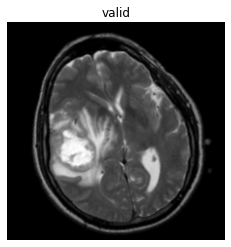

In [ ]:
img, label = valid_gen.next()
print(img[0].shape)
plt.imshow(img[0], cmap='gray', vmin=0, vmax=1)
plt.axis('off')
plt.title('valid')
plt.show()

## Tensor Board

In [ ]:
%load_ext tensorboard

In [ ]:
!rm /etc/localtime
!ln -s /usr/share/zoneinfo/Asia/Jakarta /etc/localtime
!date

Mon Oct 18 08:49:36 WIB 2021


In [ ]:
waktu =  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = os.path.join("MRI-logs", waktu)
logdir = os.path.join("logs", waktu)

In [ ]:
!kill 371
%tensorboard --logdir MRI-logs

/bin/bash: line 0: kill: (371) - No such process


Reusing TensorBoard on port 6006 (pid 331), started 0:09:17 ago. (Use '!kill 331' to kill it.)

<IPython.core.display.Javascript object>

## MobileNetV2

In [ ]:
# membuat base model dengan weights dari imagenet

IMG_SHAPE = (224, 224, 3)
base_model = MobileNetV2(input_shape=IMG_SHAPE,
                         include_top=False,
                         weights='imagenet')

base_model.trainable = False

9420800/9406464 [==============================] - 0s 0us/step


### Modifikasi model

In [ ]:
# Modifikasi 1 >> 2 kali fully connected layer, node masing-masing 320
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4,activation='softmax')(x)

In [ ]:
# Modifikasi 2 >> 2 kali fully connected layer, node masing-masing 320
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.3)(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.3)(x)
preds=Dense(4,activation='softmax')(x)

In [ ]:
# Modifikasi 3 >> 3 Fully connected layer, masing-masing 100
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(100, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(100, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(100, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4,activation='softmax')(x)

In [ ]:
# Modifikasi 4 >> 3 Fully connected layer, masing-masing 320
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(320, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(320, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(320, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4,activation='softmax')(x)

In [ ]:
# Modifikasi 5
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(500, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(500, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4, activation='softmax')(x)

In [ ]:
# Modifikasi 6
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1000, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(320, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4, activation='softmax')(x)

In [ ]:
# Modifikasi 7
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(3200, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(800, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4, activation='softmax')(x)

In [ ]:
# Modifikasi 8
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(6400, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(3200, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(2, activation='softmax')(x)

In [ ]:
# Modifikasi 9
x=base_model.output
x=GlobalAveragePooling2D()(x)
preds=Dense(4, activation='softmax')(x)

In [ ]:
# Modifikasi 10
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(8000, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(8000, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4, activation='softmax')(x)

In [ ]:
# Modifikasi 11
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(6400, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(3200, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(1600, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4, activation='softmax')(x)

In [ ]:
model=Model(inputs=base_model.input, outputs=preds)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
____________________________________________________________________________________________

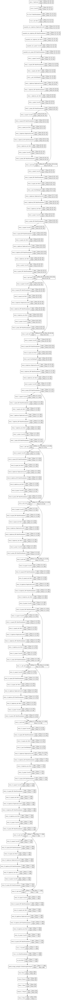

In [ ]:
model_viz = tf.keras.utils.plot_model(model,
                          to_file='mobilenet.png',
                          show_shapes=True,
                          show_layer_names=True,
                          rankdir='TB',
                          expand_nested=False)
model_viz

### Compile dan latih model

In [ ]:
model.compile(optimizer='SGD', loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
waktu =  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
epochs = 50

# Membuat log
logdir = os.path.join("MRI-logs", waktu)
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

# Mengurangi learning rate ketika perubahan akurasi data validasi kurang dari <min_delta> untuk lebih dari <patience> epochs
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.01,
                                                 patience = 3,
                                                 factor = 0.25,
                                                 verbose = 1,
                                                 cooldown = 0,
                                                 min_lr = 0.00000001)

# Berhenti melakukan proses training ketika perubahan akurasi kurang dari <min_delta> untuk lebih dari <patience> epochs
early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.005,
                                                 patience = 10,
                                                 verbose = 1,
                                                 restore_best_weights = True)
# Proses training model
history = model.fit(train_gen,
                    steps_per_epoch=len(train_gen),  
                    epochs=epochs,
                    validation_data = valid_gen,
                    callbacks=[early_stopper, reduce_lr,tensorboard_callback])

# Menyimpan model
model_dir = "model-MRI/2M"+ str(waktu)+".h5"
model.save(model_dir)

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/50
89/89 [==============================] - 125s 1s/step - loss: 0.7282 - accuracy: 0.6780 - val_loss: 0.3453 - val_accuracy: 0.8077
Epoch 2/50
89/89 [==============================] - 5s 53ms/step - loss: 0.3554 - accuracy: 0.8475 - val_loss: 1.0191 - val_accuracy: 0.7308
Epoch 3/50
89/89 [==============================] - 5s 54ms/step - loss: 0.2764 - accuracy: 0.9040 - val_loss: 0.3607 - val_accuracy: 0.7692
Epoch 4/50
89/89 [==============================] - 5s 54ms/step - loss: 0.1944 - accuracy: 0.9379 - val_loss: 0.3986 - val_accuracy: 0.8077

Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0024999999441206455.
Epoch 5/50
89/89 [==============================] - 5s 54ms/step - loss: 0.1035 - accuracy: 0.9661 - val_loss: 0.0806 - val_accuracy: 1.0000
Epoch 6/50
89/89 [==============================] - 5s 54ms/step - loss: 0.1077 - accuracy: 0.9548 - val_loss: 0.0840 - val_accuracy: 1.0000
Epoch 7/50
89/89 [==============================] - 5s 54ms/step - loss: 

In [ ]:
loss, acc = model.evaluate(train_data,steps=len(train_gen),verbose=0)
print('Akurasi dengan data latih : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(val_data,steps=len(valid_gen),verbose=0)
print('Akurasi dengan data validasi : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(test_data,steps=len(test_gen),verbose=0)
print('Akurasi dengan data tes: {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')


Akurasi dengan data latih : 0.9831 | Loss : 0.0812   
Akurasi dengan data validasi : 1.0000 | Loss : 0.0748   
Akurasi dengan data tes: 0.9251 | Loss : 0.2083   


## MobileNetV3

In [ ]:
# membuat base model dengan weights dari imagenet

IMG_SHAPE = (224, 224, 3)
base_model = MobileNetV3Small(input_shape=IMG_SHAPE,
                         include_top=False,
                         weights='imagenet')

base_model.trainable = False

### Modifikasi model

In [ ]:
# Modifikasi 1 >> 2 kali fully connected layer, node masing-masing 320
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(2,activation='softmax')(x)

In [ ]:
# Modifikasi 8
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(6400, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(3200, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(2, activation='softmax')(x)

In [ ]:
model=Model(inputs=base_model.input, outputs=preds)
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling_2 (Rescaling)         (None, 224, 224, 3)  0           input_7[0][0]                    
__________________________________________________________________________________________________
Conv (Conv2D)                   (None, 112, 112, 16) 432         rescaling_2[0][0]                
__________________________________________________________________________________________________
Conv/BatchNorm (BatchNormalizat (None, 112, 112, 16) 64          Conv[0][0]                       
____________________________________________________________________________________________

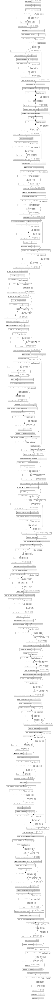

In [ ]:
model_viz = tf.keras.utils.plot_model(model,
                          to_file='mobilenetV3Small.png',
                          show_shapes=True,
                          show_layer_names=True,
                          rankdir='TB',
                          expand_nested=False,
                          dpi=20)
model_viz

### Compile dan latih model

In [ ]:
model.compile(optimizer='SGD', loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
waktu =  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
epochs = 50

# Membuat log
logdir = os.path.join("MRI-logs", waktu)
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

# Mengurangi learning rate ketika perubahan akurasi data validasi kurang dari <min_delta> untuk lebih dari <patience> epochs
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.01,
                                                 patience = 3,
                                                 factor = 0.25,
                                                 verbose = 1,
                                                 cooldown = 0,
                                                 min_lr = 0.00000001)

# Berhenti melakukan proses training ketika perubahan akurasi kurang dari <min_delta> untuk lebih dari <patience> epochs
early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.005,
                                                 patience = 10,
                                                 verbose = 1,
                                                 restore_best_weights = True)
# Proses training model
history = model.fit(train_gen,
                    steps_per_epoch=len(train_gen),  
                    epochs=epochs,
                    validation_data = valid_gen,
                    callbacks=[early_stopper, reduce_lr,tensorboard_callback])

# Menyimpan model
model_dir = "model-MRI/3M"+ str(waktu)+".h5"
model.save(model_dir)

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/50
89/89 [==============================] - 11s 81ms/step - loss: 0.7460 - accuracy: 0.5763 - val_loss: 0.6863 - val_accuracy: 0.4615
Epoch 2/50
89/89 [==============================] - 5s 55ms/step - loss: 0.6792 - accuracy: 0.6441 - val_loss: 0.9565 - val_accuracy: 0.4615
Epoch 3/50
89/89 [==============================] - 5s 53ms/step - loss: 0.6485 - accuracy: 0.6328 - val_loss: 0.6391 - val_accuracy: 0.6154
Epoch 4/50
89/89 [==============================] - 5s 53ms/step - loss: 0.6373 - accuracy: 0.6271 - val_loss: 0.6750 - val_accuracy: 0.4615
Epoch 5/50
89/89 [==============================] - 5s 53ms/step - loss: 0.6038 - accuracy: 0.6667 - val_loss: 0.7338 - val_accuracy: 0.4615
Epoch 6/50
89/89 [==============================] - 5s 54ms/step - loss: 0.5984 - accuracy: 0.6949 - val_loss: 0.7725 - val_accuracy: 0.4615

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0024999999441206455.
Epoch 7/50
89/89 [==============================] - 5s 54ms/step - loss:

In [ ]:
loss, acc = model.evaluate(train_data,steps=len(train_gen),verbose=0)
print('Akurasi dengan data latih : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(val_data,steps=len(valid_gen),verbose=0)
print('Akurasi dengan data validasi : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(test_data,steps=len(test_gen),verbose=0)
print('Akurasi dengan data tes: {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

Akurasi dengan data latih : 0.7966 | Loss : 0.5070   
Akurasi dengan data validasi : 0.7692 | Loss : 0.6086   
Akurasi dengan data tes: 0.8062 | Loss : 0.5226   


## ResNet50

In [ ]:
# membuat base model dengan weights dari imagenet dan tidak bisa di train

IMG_SHAPE = (224, 224, 3)
base_model = ResNet50(input_shape=IMG_SHAPE,
                         include_top=False,
                         weights='imagenet')

base_model.trainable = False

In [ ]:
# membuat base model dengan weights dari imagenet dan tidak bisa di train

IMG_SHAPE = (224, 224, 3)
base_model = ResNet50V2(input_shape=IMG_SHAPE,
                         include_top=False,
                         weights='imagenet')

base_model.trainable = False

94683136/94668760 [==============================] - 3s 0us/step


### Modifikasi model

In [ ]:
# Modifikasi 1
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4,activation='softmax')(x)

In [ ]:
# Modifikasi 8
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(6400, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(3200, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(2, activation='softmax')(x)

In [ ]:
model=Model(inputs=base_model.input, outputs=preds)
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
____________________________________________________________________________________________

### Compile dan latih model

In [ ]:
model.compile(optimizer='SGD', loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
waktu =  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
epochs = 50

# Membuat log
logdir = os.path.join("MRI-logs", waktu)
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

# Mengurangi learning rate ketika perubahan akurasi data validasi kurang dari <min_delta> untuk lebih dari <patience> epochs
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.01,
                                                 patience = 3,
                                                 factor = 0.25,
                                                 verbose = 1,
                                                 cooldown = 0,
                                                 min_lr = 0.00000001)

# Berhenti melakukan proses training ketika perubahan akurasi kurang dari <min_delta> untuk lebih dari <patience> epochs
early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.005,
                                                 patience = 10,
                                                 verbose = 1,
                                                 restore_best_weights = True)
# Proses training model
history = model.fit(train_gen,
                    steps_per_epoch=len(train_gen),  
                    epochs=epochs,
                    validation_data = valid_gen,
                    callbacks=[early_stopper, reduce_lr,tensorboard_callback])

# Menyimpan model
model_dir = "model-MRI/RV2"+ str(waktu)+".h5"
model.save(model_dir)

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/50
89/89 [==============================] - 12s 88ms/step - loss: 0.9611 - accuracy: 0.6836 - val_loss: 0.3070 - val_accuracy: 0.8462
Epoch 2/50
89/89 [==============================] - 6s 62ms/step - loss: 0.4040 - accuracy: 0.8192 - val_loss: 0.1204 - val_accuracy: 0.9615
Epoch 3/50
89/89 [==============================] - 5s 61ms/step - loss: 0.2592 - accuracy: 0.8814 - val_loss: 0.0833 - val_accuracy: 1.0000
Epoch 4/50
89/89 [==============================] - 6s 62ms/step - loss: 0.0906 - accuracy: 0.9774 - val_loss: 0.1536 - val_accuracy: 0.9615
Epoch 5/50
89/89 [==============================] - 6s 62ms/step - loss: 0.1828 - accuracy: 0.9322 - val_loss: 0.1545 - val_accuracy: 0.9615
Epoch 6/50
89/89 [==============================] - 5s 61ms/step - loss: 0.2243 - accuracy: 0.9209 - val_loss: 0.2211 - val_accuracy: 0.8462

Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0024999999441206455.
Epoch 7/50
89/89 [==============================] - 5s 61ms/step - loss:

In [ ]:
loss, acc = model.evaluate(train_data,steps=len(train_gen),verbose=0)
print('Akurasi dengan data latih : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(val_data,steps=len(valid_gen),verbose=0)
print('Akurasi dengan data validasi : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(test_data,steps=len(test_gen),verbose=0)
print('Akurasi dengan data tes: {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

Akurasi dengan data latih : 0.9831 | Loss : 0.0828   
Akurasi dengan data validasi : 0.9615 | Loss : 0.1330   
Akurasi dengan data tes: 0.9339 | Loss : 0.2142   


## ResNet152

In [ ]:
# membuat base model dengan weights dari imagenet dan tidak bisa di train

IMG_SHAPE = (224, 224, 3)
base_model = ResNet152(input_shape=IMG_SHAPE,
                         include_top=False,
                         weights='imagenet')

base_model.trainable = False

234708992/234698864 [==============================] - 2s 0us/step


In [ ]:
# membuat base model dengan weights dari imagenet dan tidak bisa di train

IMG_SHAPE = (224, 224, 3)
base_model = ResNet152V2(input_shape=IMG_SHAPE,
                         include_top=False,
                         weights='imagenet')

base_model.trainable = False

234561536/234545216 [==============================] - 5s 0us/step


### Modifikasi model

In [ ]:
# Modifikasi 1
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4,activation='softmax')(x)

In [ ]:
# Modifikasi 8
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(6400, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(3200, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(2, activation='softmax')(x)

In [ ]:
model=Model(inputs=base_model.input, outputs=preds)
model.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_5[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
____________________________________________________________________________________________

### Compile model dan latih model

In [ ]:
model.compile(optimizer='SGD', loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
waktu =  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
epochs = 50

# Membuat log
logdir = os.path.join("MRI-logs", waktu)
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

# Mengurangi learning rate ketika perubahan akurasi data validasi kurang dari <min_delta> untuk lebih dari <patience> epochs
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.01,
                                                 patience = 3,
                                                 factor = 0.25,
                                                 verbose = 1,
                                                 cooldown = 0,
                                                 min_lr = 0.00000001)

# Berhenti melakukan proses training ketika perubahan akurasi kurang dari <min_delta> untuk lebih dari <patience> epochs
early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.005,
                                                 patience = 10,
                                                 verbose = 1,
                                                 restore_best_weights = True)
# Proses training model
history = model.fit(train_gen,
                    steps_per_epoch=len(train_gen),  
                    epochs=epochs,
                    validation_data = valid_gen,
                    callbacks=[early_stopper, reduce_lr,tensorboard_callback])

# Menyimpan model
model_dir = "model-MRI/152R"+ str(waktu)+".h5"
model.save(model_dir)

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/50
89/89 [==============================] - 24s 157ms/step - loss: 1.0746 - accuracy: 0.7119 - val_loss: 1.5491 - val_accuracy: 0.5385
Epoch 2/50
89/89 [==============================] - 9s 104ms/step - loss: 0.5028 - accuracy: 0.8079 - val_loss: 0.3589 - val_accuracy: 0.9231
Epoch 3/50
89/89 [==============================] - 9s 103ms/step - loss: 0.3631 - accuracy: 0.8531 - val_loss: 0.3204 - val_accuracy: 0.8462
Epoch 4/50
89/89 [==============================] - 9s 105ms/step - loss: 0.2035 - accuracy: 0.9209 - val_loss: 0.3499 - val_accuracy: 0.9231
Epoch 5/50
89/89 [==============================] - 9s 105ms/step - loss: 0.3083 - accuracy: 0.8814 - val_loss: 0.1402 - val_accuracy: 0.9231

Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0024999999441206455.
Epoch 6/50
89/89 [==============================] - 9s 104ms/step - loss: 0.1385 - accuracy: 0.9492 - val_loss: 0.1325 - val_accuracy: 0.9231
Epoch 7/50
89/89 [==============================] - 9s 104ms/step 

In [ ]:
loss, acc = model.evaluate(train_data,steps=len(train_gen),verbose=0)
print('Akurasi dengan data latih : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(val_data,steps=len(valid_gen),verbose=0)
print('Akurasi dengan data validasi : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(test_data,steps=len(test_gen),verbose=0)
print('Akurasi dengan data tes: {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

Akurasi dengan data latih : 0.9944 | Loss : 0.0461   
Akurasi dengan data validasi : 0.9615 | Loss : 0.1489   
Akurasi dengan data tes: 0.9383 | Loss : 0.2214   


## Xception

In [ ]:
# membuat base model dengan weights dari imagenet dan tidak bisa di train

IMG_SHAPE = (224, 224, 3)
base_model = Xception(input_shape=IMG_SHAPE,
                         include_top=False,
                         weights='imagenet')

base_model.trainable = False

83697664/83683744 [==============================] - 1s 0us/step


### Modifikasi model

In [ ]:
# Modifikasi 1 >> 2 kali fully connected layer, node masing-masing 320
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(320,activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(4,activation='softmax')(x)

In [ ]:
# Modifikasi 8
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(6400, activation='relu')(x)
x=Dropout(0.2)(x)
x=Dense(3200, activation='relu')(x)
x=Dropout(0.2)(x)
preds=Dense(2, activation='softmax')(x)

In [ ]:
model=Model(inputs=base_model.input, outputs=preds)
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 111, 111, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 111, 111, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 111, 111, 32) 0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

### Compile Model dan latih model

In [ ]:
model.compile(optimizer='SGD', loss='categorical_crossentropy',metrics=['accuracy'])

In [ ]:
waktu =  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
epochs = 50

# Membuat log
logdir = os.path.join("MRI-logs", waktu)
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

# Mengurangi learning rate ketika perubahan akurasi data validasi kurang dari <min_delta> untuk lebih dari <patience> epochs
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.01,
                                                 patience = 3,
                                                 factor = 0.25,
                                                 verbose = 1,
                                                 cooldown = 0,
                                                 min_lr = 0.00000001)

# Berhenti melakukan proses training ketika perubahan akurasi kurang dari <min_delta> untuk lebih dari <patience> epochs
early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.005,
                                                 patience = 10,
                                                 verbose = 1,
                                                 restore_best_weights = True)
# Proses training model
history = model.fit(train_gen,
                    steps_per_epoch=len(train_gen),  
                    epochs=epochs,
                    validation_data = valid_gen,
                    callbacks=[early_stopper, reduce_lr,tensorboard_callback])

# Menyimpan model
model_dir = "model-MRI/X"+ str(waktu)+".h5"
model.save(model_dir)

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/50
89/89 [==============================] - 11s 85ms/step - loss: 0.5512 - accuracy: 0.7571 - val_loss: 0.3089 - val_accuracy: 0.9231
Epoch 2/50
89/89 [==============================] - 5s 61ms/step - loss: 0.4283 - accuracy: 0.8136 - val_loss: 0.2490 - val_accuracy: 0.9615
Epoch 3/50
89/89 [==============================] - 5s 61ms/step - loss: 0.2783 - accuracy: 0.8814 - val_loss: 0.2036 - val_accuracy: 0.9615
Epoch 4/50
89/89 [==============================] - 5s 61ms/step - loss: 0.2563 - accuracy: 0.9209 - val_loss: 0.1725 - val_accuracy: 1.0000
Epoch 5/50
89/89 [==============================] - 6s 67ms/step - loss: 0.2252 - accuracy: 0.9096 - val_loss: 0.2629 - val_accuracy: 0.8846
Epoch 6/50
89/89 [==============================] - 5s 61ms/step - loss: 0.1742 - accuracy: 0.9322 - val_loss: 0.1738 - val_accuracy: 0.9615
Epoch 7/50
89/89 [==============================] - 5s 61ms/step - loss: 0.1727 - accuracy: 0.9492 - val_loss: 0.2190 - val_accuracy: 0.9231

Epoch 00007

In [ ]:
loss, acc = model.evaluate(train_data,steps=len(train_gen),verbose=0)
print('Akurasi dengan data latih : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(val_data,steps=len(valid_gen),verbose=0)
print('Akurasi dengan data validasi : {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

loss, acc = model.evaluate(test_data,steps=len(test_gen),verbose=0)
print('Akurasi dengan data tes: {:.4f} | Loss : {:.4f}'.format(acc,loss),'  ')

Akurasi dengan data latih : 0.9435 | Loss : 0.1535   
Akurasi dengan data validasi : 0.9231 | Loss : 0.2990   
Akurasi dengan data tes: 0.9119 | Loss : 0.2207   


## Evaluasi

In [ ]:
ls model-MRI/

152R20211013-090318.h5  20211009-211144.h5    2M20211013-174336.h5
152R20211013-093242.h5  2M20211013-082500.h5  2M20211013-180929.h5
152R20211015-063333.h5  2M20211013-084043.h5  2M20211014-135835.h5
152R20211017-002034.h5  2M20211013-144333.h5  2M20211017-204600.h5
20211009-194912.h5      2M20211013-163412.h5  3M20211013-085439.h5
20211009-201316.h5      2M20211013-165714.h5  RV220211016-144927.h5
20211009-203358.h5      2M20211013-171019.h5  X20211017-074726.h5
20211009-205250.h5      2M20211013-172942.h5  X20211017-075604.h5


20211013-171019

In [ ]:
model = load_model('model/2M20211013-171019.h5')

In [ ]:
probabilitas = model.predict(test_gen)
prediksi = np.argmax(probabilitas, axis=1)
label_sebenarnya = test_gen.classes
cm=confusion_matrix(label_sebenarnya, prediksi)

In [ ]:
kelas = test_gen.class_indices

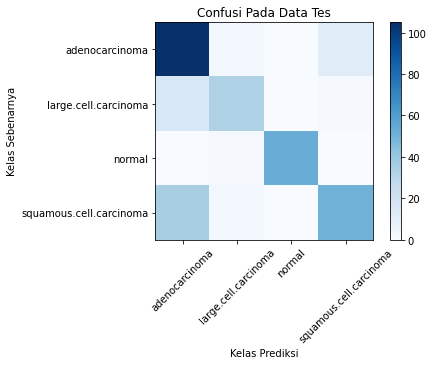

In [ ]:
# plot matriks confusi
plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
plt.colorbar()
tick_marks = np.arange(len(kelas))
plt.xticks(tick_marks, kelas, rotation=45)
plt.yticks(tick_marks, kelas)
plt.xlabel("Kelas Prediksi")
plt.ylabel("Kelas Sebenarnya")
plt.title('Confusi Pada Data Tes')
plt.show()

In [ ]:
print(classification_report(label_sebenarnya, prediksi, target_names=kelas))

                         precision    recall  f1-score   support

         adenocarcinoma       0.67      0.88      0.76       120
   large.cell.carcinoma       0.83      0.67      0.74        51
                 normal       1.00      0.98      0.99        54
squamous.cell.carcinoma       0.80      0.57      0.66        90

               accuracy                           0.77       315
              macro avg       0.82      0.77      0.79       315
           weighted avg       0.79      0.77      0.77       315

